# Example No 1 : CNN model by Keras for 6 Categories Images Classification

# Table of Content 
- [ 1 - Introduction ](#intro)
    - [ 1.1 What is the new we will learn in this example ? ](#example_imp)
    - [ 1.2 The source of the data ](#data_source)
    
    - [ 1.3 Load the required libraries ](#import)
    
- [ 2 - Data preparation ](#preparation)
    - [ 2.1 Check the data ](#data_check)
    - [ 2.2 Check the images ](#images_check)

    - [ 2.3 Reading Images ](#images_reading)


- [ 3- Build CNN model ](#CNN_model)
    - [ 3.1 Define our CNN model ](#define_model)

    - [ 3.2 Compile our Model ](#compile_model)

- [ 4- Train (Fit) the model](#train_evaluate)
    - [ 4.1 Train (Fit) our CNN Model ](#train_model)

- [5- Prediction ](#prediction)
    - [ 5.1 Make Predictions using our trained model ](#make_prediction)

    - [ 5.2 Visualization random predicted pictures & its predicting category  ](#visualization)

-  [ Further TensorFlow (Keras) Applications for CNN ](#other_apps)

-  [ Key Resources Utilized in Crafting This Notebook](#resources)

<a name="intro"></a>
## 1 - Introduction

<a name="example_imp"></a>
### 1.1 What is the new we will learn in this example ?
We will build a CNN using Keras for the purpose of classifying thousands of pictures in six different categories. 

<a name="data_source"></a>
### 1.2 The source of the data 
The data used in this example is called Intel Image Classification and you can download from [Kaggle](https://www.kaggle.com/puneet6060/intel-image-classification) 

<a name="import"></a>
### 1.3 Load the required libraries

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

<a name="preparation"></a>
## 2 - Data preparation 

> Define the path ( to switch it between jupyter notebook & kaggle kernel)

In [37]:
### for Kaggle
# trainpath = '../input/intel-image-classification/seg_train/'
# testpath = '../input/intel-image-classification/seg_test/'
# predpath = '../input/intel-image-classification/seg_pred/'

### for Jupyter
trainpath = 'Intel_Image_Classification/seg_train'
testpath = 'Intel_Image_Classification/seg_test'
predpath = 'Intel_Image_Classification/seg_pred'

<a name="data_check"></a>
### 2.1 Check the data

####  A ) Check the training data

In [38]:
for folder in  os.listdir(trainpath) : 
    files = gb.glob(pathname= str( trainpath+ '//'+folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2271 in folder forest
For training data , found 2191 in folder buildings
For training data , found 2404 in folder glacier
For training data , found 2382 in folder street
For training data , found 2512 in folder mountain
For training data , found 2274 in folder sea


####  B ) Check the test data

In [39]:
for folder in  os.listdir(testpath) : 
    files = gb.glob(pathname= str( testpath +'//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 474 in folder forest
For testing data , found 437 in folder buildings
For testing data , found 553 in folder glacier
For testing data , found 501 in folder street
For testing data , found 525 in folder mountain
For testing data , found 510 in folder sea



####  C ) Check the prediction data 

In [40]:
files = gb.glob(pathname= str(predpath +'/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


<a name="images_check"></a>
###  2.2 Check the images

* since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back

In [41]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

#### A )  Images size in train folder

In [42]:
size = []
for folder in  os.listdir(trainpath) : 
    files = gb.glob(pathname= str( trainpath +'//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(134, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(144, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(136, 150, 3)        2
(108, 150, 3)        2
(119, 150, 3)        1
(81, 150, 3)         1
(100, 150, 3)        1
(141, 150, 3)        1
(145, 150, 3)        1
(131, 150, 3)        1
(103, 150, 3)        1
(147, 150, 3)        1
(102, 150, 3)        1
(97, 150, 3)         1
(110, 150, 3)        1
(120, 150, 3)        1
(115, 150, 3)        1
(105, 150, 3)        1
(76, 150, 3)         1
(149, 150, 3)        1
(124, 150, 3)        1
(133, 150, 3)        1
(140, 150, 3)        1
Name: count, dtype: int64

> almost all of them are 150,150,3

#### B ) Images size in test folder

In [43]:
size = []
for folder in  os.listdir(testpath) : 
    files = gb.glob(pathname= str( testpath +'//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(141, 150, 3)       1
(110, 150, 3)       1
(149, 150, 3)       1
(72, 150, 3)        1
(76, 150, 3)        1
(131, 150, 3)       1
(81, 150, 3)        1
Name: count, dtype: int64

#### C ) Images size in prediction

In [44]:
size = []
files = gb.glob(pathname= str(predpath +'/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(144, 150, 3)       1
(108, 150, 3)       1
(126, 150, 3)       1
(131, 150, 3)       1
(112, 150, 3)       1
(124, 150, 3)       1
(139, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(149, 150, 3)       1
(143, 150, 3)       1
(129, 150, 3)       1
(133, 150, 3)       1
Name: count, dtype: int64

> ok , since almost all of pictures are 150,150,3 , we can feel comfort in using all pictures in our model , after resizing it in a specific amount

<a name="images_reading"></a>
### 2.3 Reading Images

* Now it's time to read all images & convert it into arrays

* first we'll create a variable s , which refer to size , so we can change it easily 

* let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [45]:
s = 100

now to read all pictues in six categories in training folder, ans use OpenCV to resize it , and not to forget to assign the y value , from the predefined function 

In [46]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath) : 
    files = gb.glob(pathname= str( trainpath +'//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

great , now how many items in X_train 

In [47]:
print(f'we have {len(X_train)} items in X_train')

we have 14034 items in X_train


> look to random pictures in X_train , and to adjust their title using the y value

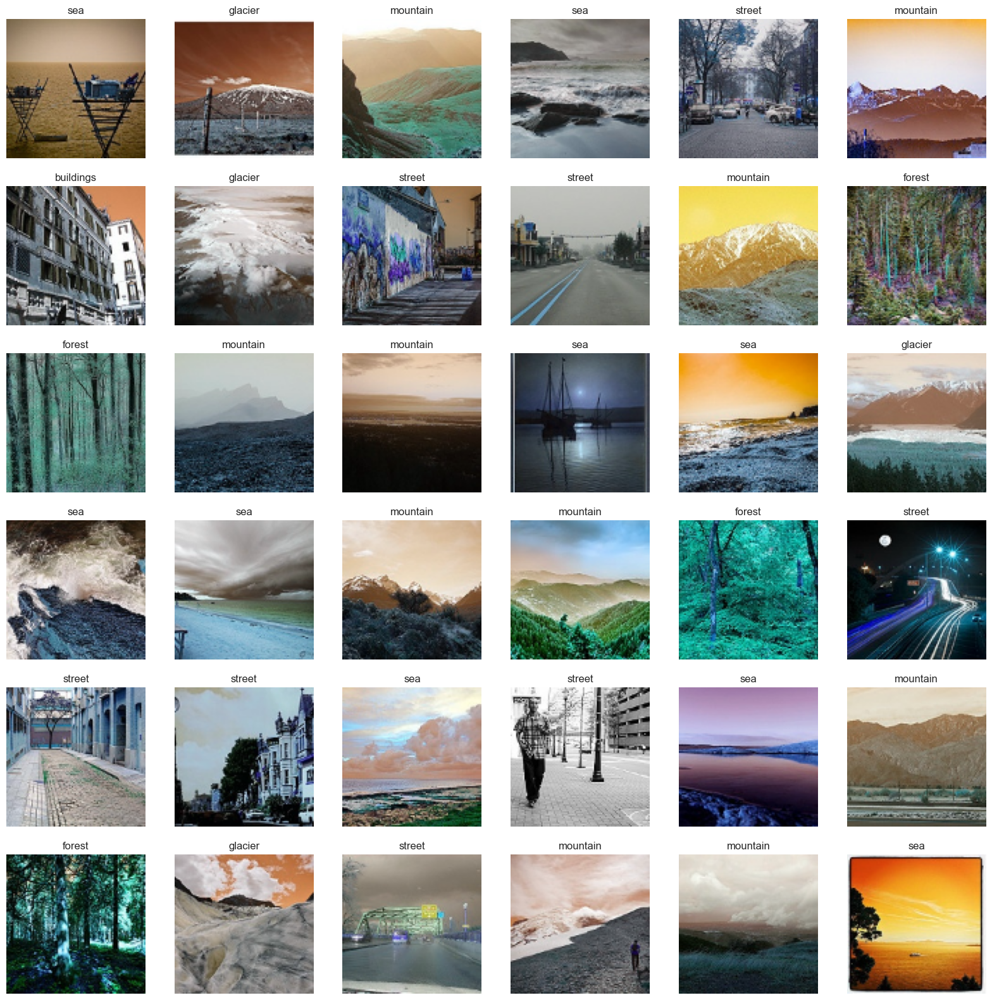

In [48]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

great , now to repeat same steps exactly in test data

In [49]:
X_test = []
y_test = []
for folder in  os.listdir(testpath) : 
    files = gb.glob(pathname= str(testpath + '//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])
        

In [50]:
print(f'we have {len(X_test)} items in X_test')

we have 3000 items in X_test


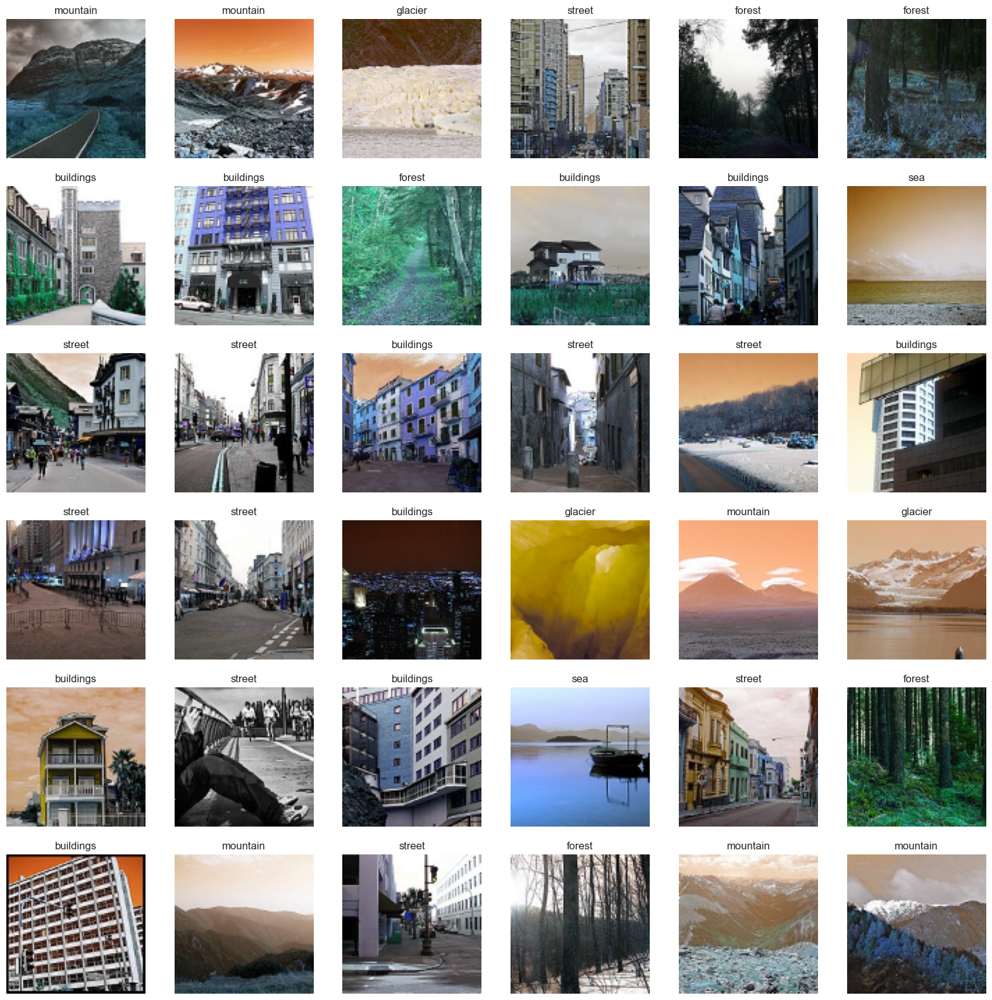

In [51]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

also with Prediction data , without having title of course

In [52]:
X_pred = []
files = gb.glob(pathname= str(predpath + '/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))       

In [53]:
print(f'we have {len(X_pred)} items in X_pred')

we have 7301 items in X_pred


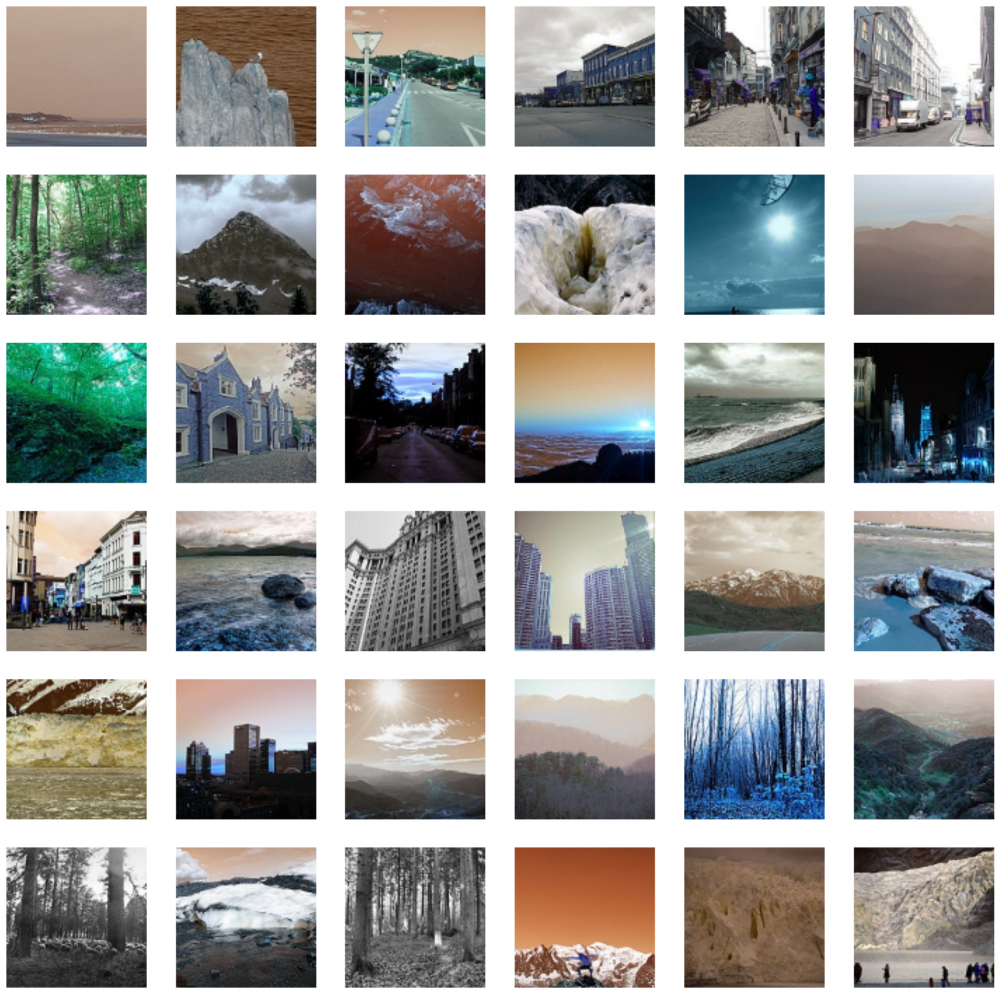

In [54]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

<a name="CNN_model"></a>
## 3- Build CNN model

> First to convert the data into arrays using numpy

In [55]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


<a name="define_model"></a>
### 3.1 Define our CNN model

now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses

In [56]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

<a name="compile_model"></a>
### 3.2 Compile our Model

In [57]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

so how the model looks like ? 

In [58]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 98, 98, 200)       5600      
                                                                 
 conv2d_6 (Conv2D)           (None, 96, 96, 150)       270150    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 24, 24, 150)      0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 22, 22, 120)       162120    
                                                                 
 conv2d_8 (Conv2D)           (None, 20, 20, 80)        86480     
                                                                 
 conv2d_9 (Conv2D)           (None, 18, 18, 50)        36050     
                                 

<a name="train_evaluate"></a>
## 4. Train & Evaluate the model

<a name="train_model"></a>
### 4.1 Train (Fit) our CNN Model

now to train the model , lets use 20 epochs now

In [59]:
epochs = 20  # u can use 50 later 
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)


Epoch 1/20
220/220 [==============================] - 709s 3s/step - loss: 1.4964 - accuracy: 0.4164
Epoch 2/20
220/220 [==============================] - 900s 4s/step - loss: 1.0936 - accuracy: 0.5718
Epoch 3/20
220/220 [==============================] - 1120s 5s/step - loss: 0.9622 - accuracy: 0.6367
Epoch 4/20
220/220 [==============================] - 751s 3s/step - loss: 0.8833 - accuracy: 0.6733
Epoch 5/20
220/220 [==============================] - 649s 3s/step - loss: 0.8198 - accuracy: 0.7092
Epoch 6/20
 92/220 [===========>..................] - ETA: 6:20 - loss: 0.7396 - accuracy: 0.7424

how is the final loss & accuracy


In [ ]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 38s 402ms/step - loss: 0.5598 - accuracy: 0.8157
Test Loss is 0.5597844123840332
Test Accuracy is 0.815666675567627


ok , only 80% accuracy & can be increased by tuning the hyperparameters


<a name="prediction"></a>
## 5- Prediction

<a name="make_prediction"></a>
### 5.1 Make Predictions using our trained model

In [ ]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

94/94 [==============================] - 37s 391ms/step
Prediction Shape is (3000, 6)


great

now it's time to redict X Predict

In [ ]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 [==============================] - 89s 390ms/step
Prediction Shape is (7301, 6)


<a name="visualization"></a>
### 5.2 Visualization random predicted pictures & its predicting category

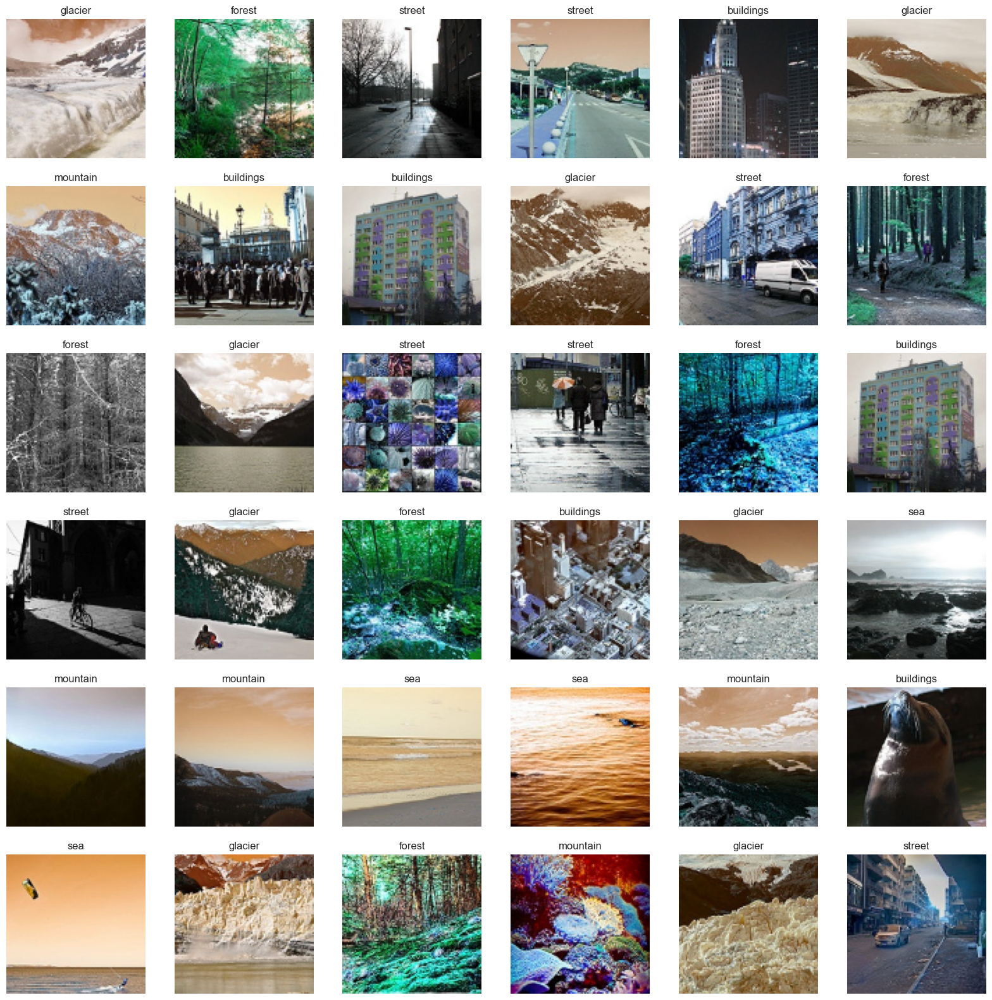

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

> My Observation and comments on this examples : 
* Adjusting the correct and incorrect items will improve the accuracy of the predictions display.
* No normalization or augmentation here for the images which may enhance the performance of the model. 
* It appears that the model may benefit from additional epochs to achieve higher performance, and we should consider trying 50 epochs. I just used 10 here for the seek of time. 

&nbsp;

<a name="other_apps"></a>
## Further TensorFlow (Keras) Applications for CNN 
---------
* [The basic tools of Keras for CNN](../2_Keras_BasicTools_CNN.ipynb)

* [Example No 2](Example_No_2_mnist_dataset_acc99.ipynb) : MNIST dataset (Acc 0.997).

* [Example No 3](Example_No_3_fashion_related_dataset.ipynb) : fashion-related dataset. 

* [Example No 4](Example_No_4_cats_dogs_classification.ipynb) : Cats & Dogs Classification. 

* [Example No 5](Example_No_5_Cats_Dogs_classifer.ipynb) : Cats & Dogs classifier and compare to the DNN model. 

&nbsp;
<a name="resources"></a>
## Key Resources Utilized in Crafting This Notebook :
--------------------------
- <a rel="keras_website" href="https://keras.io"> Keras Official Website. </a>
- <a rel="the code used" href="https://www.youtube.com/watch?v=ohyn_MzS_hE&list=PL6-3IRz2XF5VbuU2T0gS_mFhCpKmLxvCP"> Playlist for Keras in Arabic by Hesham Asem. </a>
- <a rel="the code used2" href="https://github.com/HeshamAsem/CNN"> Hesham Asem GitHub for ML tools. </a>